In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
import numpy as np
from PIL import Image
import os
from glob import glob
from sklearn.model_selection import train_test_split
import gc


high_path='/kaggle/input/lol-dataset1/lol_dataset/our485/high'
low_path='/kaggle/input/lol-dataset1/lol_dataset/our485/low'

# Parameters
IMG_HEIGHT = 384
IMG_WIDTH = 384

# Helper function to load and preprocess images
def load_images(low_dir, high_dir):
    low_paths = sorted(glob(os.path.join(low_dir, '*.png')))
    high_paths = sorted(glob(os.path.join(high_dir, '*.png')))

    low_images = []
    high_images = []

    for l_path, h_path in zip(low_paths, high_paths):
        low_img = Image.open(l_path).convert('RGB').resize((IMG_WIDTH, IMG_HEIGHT))
        high_img = Image.open(h_path).convert('RGB').resize((IMG_WIDTH, IMG_HEIGHT))

        low_img = np.array(low_img) / 255.0
        high_img = np.array(high_img) / 255.0

        low_images.append(low_img)
        high_images.append(high_img)

    return np.array(low_images), np.array(high_images)

print("Loading images...")
low_images, high_images = load_images(low_path, high_path)
print(f"Loaded {len(low_images)} samples.")

In [ ]:
# Split dataset
x_train, x_val, y_train, y_val = train_test_split(
    low_images, high_images, test_size=0.15, random_state=42
)

# Dataset pipelines
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(BATCH_SIZE).shuffle(100).prefetch(tf.data.AUTOTUNE)
val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [3]:
# --- 2. IMPROVED LOSS FUNCTION ---
def ssim_loss(y_true, y_pred):
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

def combined_loss(y_true, y_pred, alpha=0.84):
    """
    Combines MAE and SSIM loss.
    alpha controls the weight of the SSIM loss.
    """
    # Use the fundamental TensorFlow operation for MAE to ensure compatibility
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    
    ssim = ssim_loss(y_true, y_pred)
    return (1 - alpha) * mae + alpha * ssim

# --- 3. ENHANCED U-NET ARCHITECTURE ---
def conv_block(x, filters, kernel_size=3, activation=True):
    """Convolutional block with Conv2D -> Batch Norm -> Leaky ReLU."""
    x = layers.Conv2D(filters, kernel_size, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.LeakyReLU(alpha=0.2)(x)
    return x

def build_enhanced_unet(input_shape=(384, 384, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = conv_block(inputs, 64)
    c1 = conv_block(c1, 64)
    p1 = layers.MaxPooling2D(2)(c1)

    c2 = conv_block(p1, 128)
    c2 = conv_block(c2, 128)
    p2 = layers.MaxPooling2D(2)(c2)

    c3 = conv_block(p2, 256)
    c3 = conv_block(c3, 256)
    p3 = layers.MaxPooling2D(2)(c3)

    c4 = conv_block(p3, 512)
    c4 = conv_block(c4, 512)
    p4 = layers.MaxPooling2D(2)(c4)

    # Bottleneck
    b = conv_block(p4, 1024)
    b = conv_block(b, 1024)

    # Decoder
    u1 = layers.UpSampling2D(2)(b)
    u1 = layers.Concatenate()([u1, c4])
    c5 = conv_block(u1, 512)
    c5 = conv_block(c5, 512)

    u2 = layers.UpSampling2D(2)(c5)
    u2 = layers.Concatenate()([u2, c3])
    c6 = conv_block(u2, 256)
    c6 = conv_block(c6, 256)

    u3 = layers.UpSampling2D(2)(c6)
    u3 = layers.Concatenate()([u3, c2])
    c7 = conv_block(u3, 128)
    c7 = conv_block(c7, 128)

    u4 = layers.UpSampling2D(2)(u3) # Corrected this line from your code, should be u3
    u4 = layers.Concatenate()([u4, c1])
    c8 = conv_block(u4, 64)
    c8 = conv_block(c8, 64)

    outputs = layers.Conv2D(3, 1, activation='sigmoid')(c8)

    model = models.Model(inputs, outputs)
    return model

# --- 4. BUILD, COMPILE, AND TRAIN ---
# Build and compile model
model = build_enhanced_unet()
# Using a slightly lower learning rate can also help with stability
optimizer = Adam(learning_rate=1e-4) 
model.compile(optimizer=optimizer, loss=combined_loss)

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 384, 384,  │      1,728 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 384, 384,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 384, 384,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 384, 384,  │     36,864 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 384, 384,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 384, 384,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 192, 192,  │          0 │ leaky_re_lu_1[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 192, 192,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 192, 192,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 192, 192,  │    147,456 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 192, 192,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 96, 96,    │          0 │ leaky_re_lu_3[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 96, 96,    │    294,912 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 96, 96,    │      1,024 │ conv2d_4[0][0]  

 Total params: 30,953,347 (118.08 MB)

 Trainable params: 30,942,083 (118.03 MB)

 Non-trainable params: 11,264 (44.00 KB)

In [5]:
class ClearMemoryCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        gc.collect()
        tf.keras.backend.clear_session()
        # print(f"Memory cleared after epoch {epoch + 1}") # Optional: can be verbose

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=4, verbose=1, min_lr=1e-8
)
clear_memory = ClearMemoryCallback()
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    "best_model_Unet_enhanced.h5", monitor="val_loss", save_best_only=True, mode="min", verbose=1
)

In [6]:
# Train the model
history = model.fit(
    train_dataset,
    epochs=20,
    validation_data=val_dataset,
    callbacks=[lr_scheduler, checkpoint_cb] # Removed clear_memory for performance
)

Epoch 1/20


I0000 00:00:1758295715.879389      94 service.cc:148] XLA service 0x7d83dc004400 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758295715.880122      94 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
W0000 00:00:1758295716.584721      94 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1758295716.585679      94 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1758295716.586358      94 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1758295716.586828      94 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
I0000 00:00:1758295717.101878      94 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/412 ━━━━━━━━━━━━━━━━━━━━ 3:27:11 30s/step - loss: 0.8278

I0000 00:00:1758295730.781659      94 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.2403

W0000 00:00:1758295770.358548      95 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1758295770.359578      95 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1758295770.360307      95 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1758295770.360899      95 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert



Epoch 1: val_loss improved from inf to 0.32553, saving model to best_model_Unet_enhanced.h5
412/412 ━━━━━━━━━━━━━━━━━━━━ 73s 104ms/step - loss: 0.2402 - val_loss: 0.3255 - learning_rate: 1.0000e-04
Epoch 2/20
412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1604
Epoch 2: val_loss improved from 0.32553 to 0.20125, saving model to best_model_Unet_enhanced.h5
412/412 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1604 - val_loss: 0.2013 - learning_rate: 1.0000e-04
Epoch 3/20
412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1454
Epoch 3: val_loss did not improve from 0.20125
412/412 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1454 - val_loss: 0.2043 - learning_rate: 1.0000e-04
Epoch 4/20
412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1443
Epoch 4: val_loss improved from 0.20125 to 0.18338, saving model to best_model_Unet_enhanced.h5
412/412 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1443 - val_loss: 0.1834 - learning_rate: 1.0000e-04
Epoch 5/20
412/412 ━━━━━━━━━━━━━━━━━━━━ 0s 

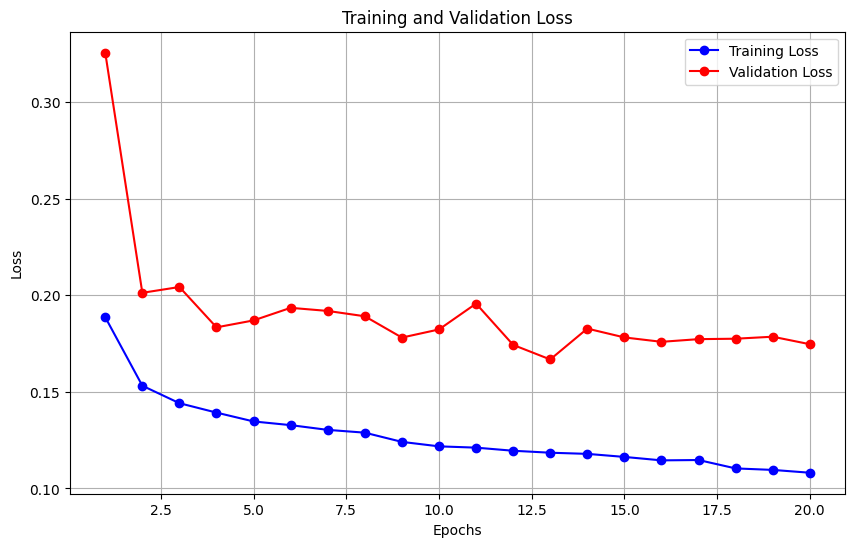

In [7]:
import matplotlib.pyplot as plt


train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Get the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


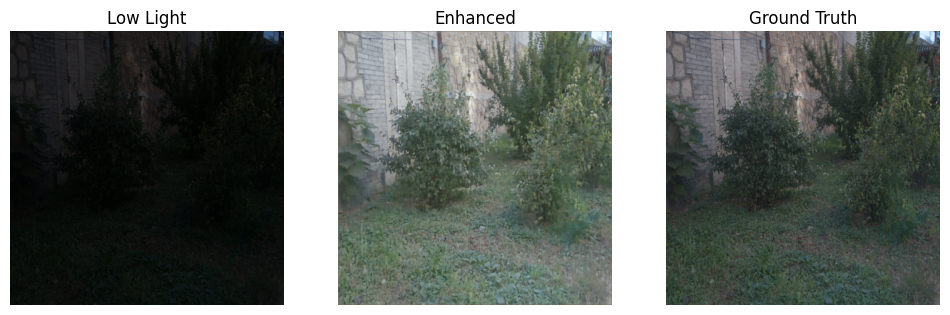

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


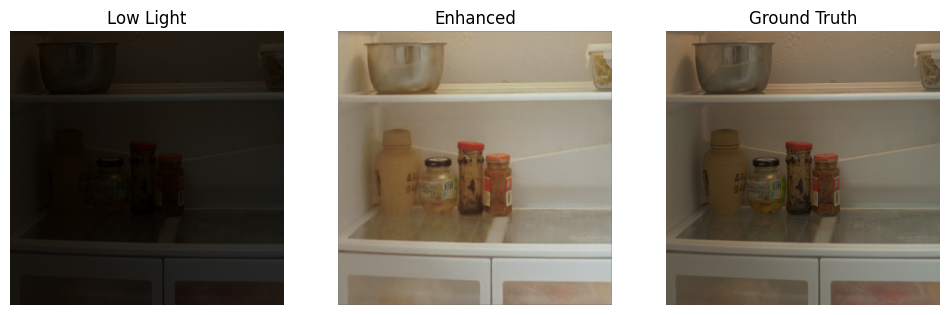

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


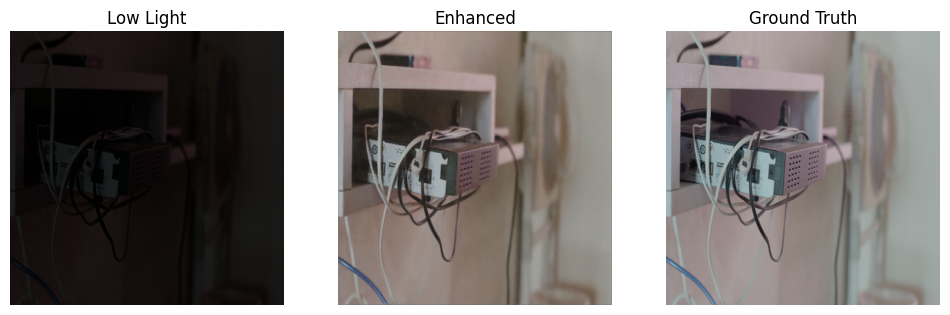

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


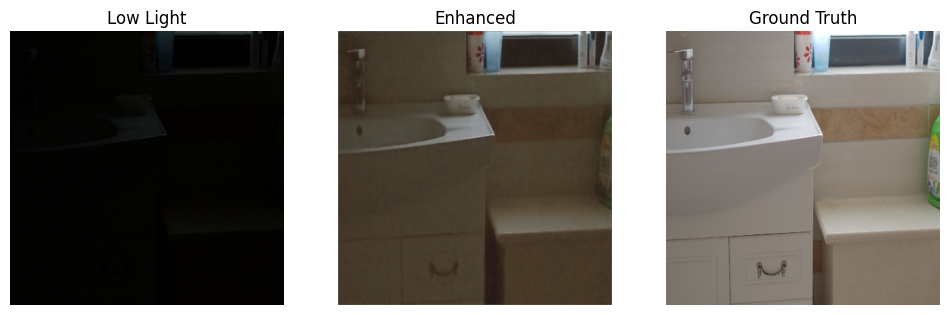

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


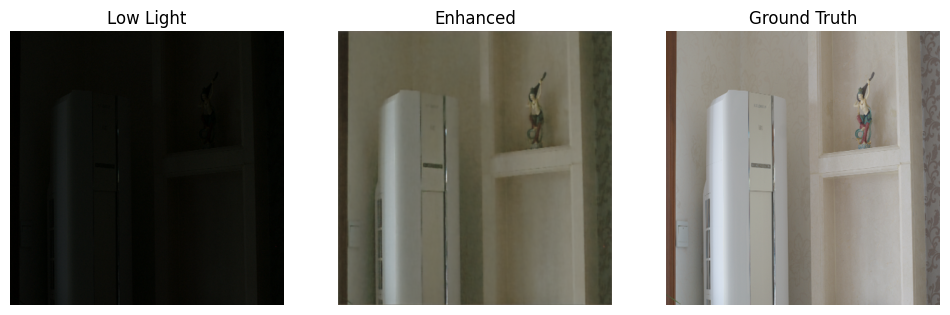

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


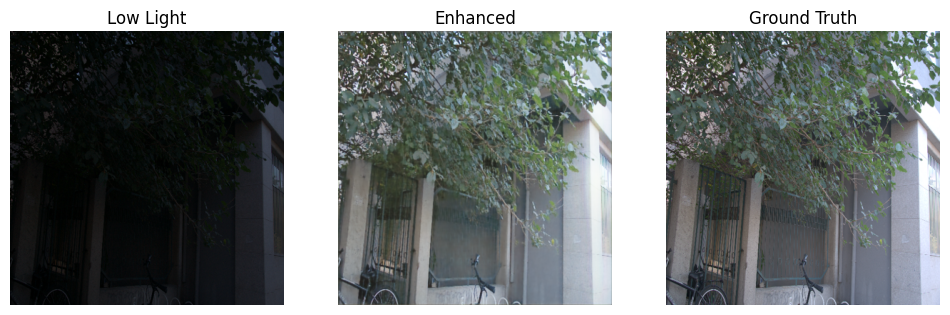

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


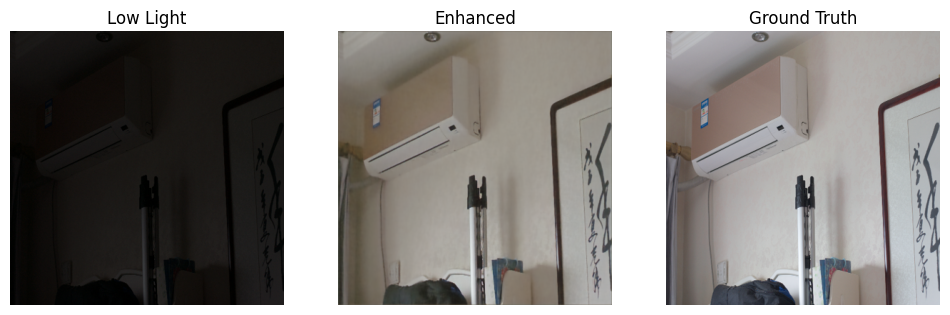

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


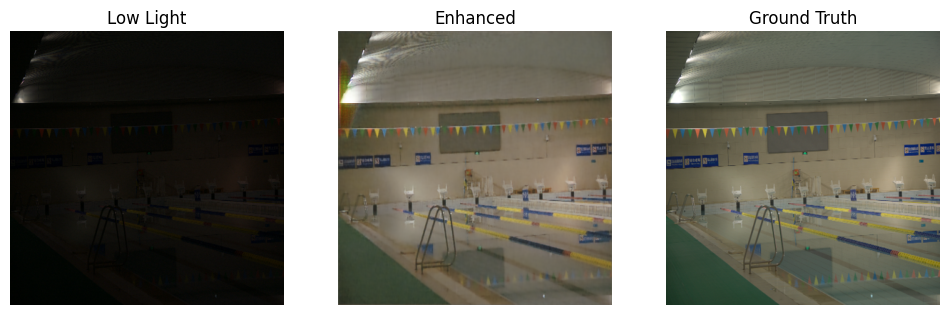

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


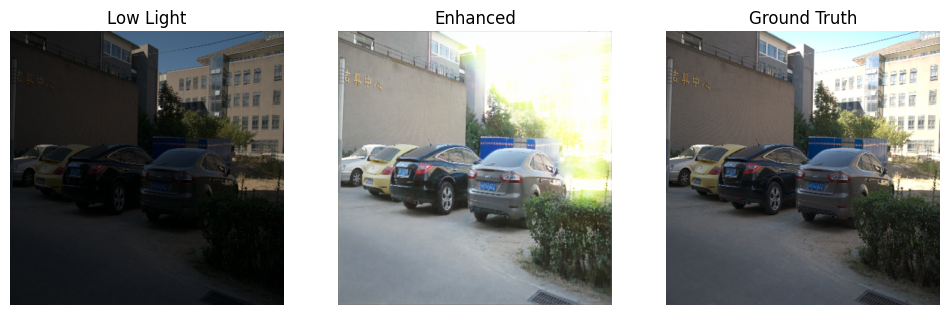

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


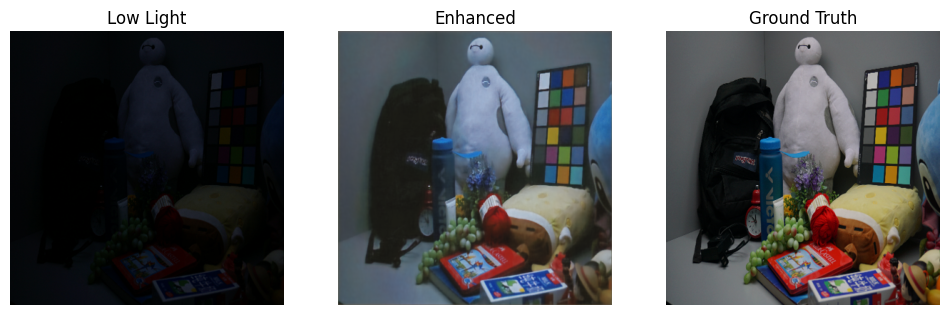

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


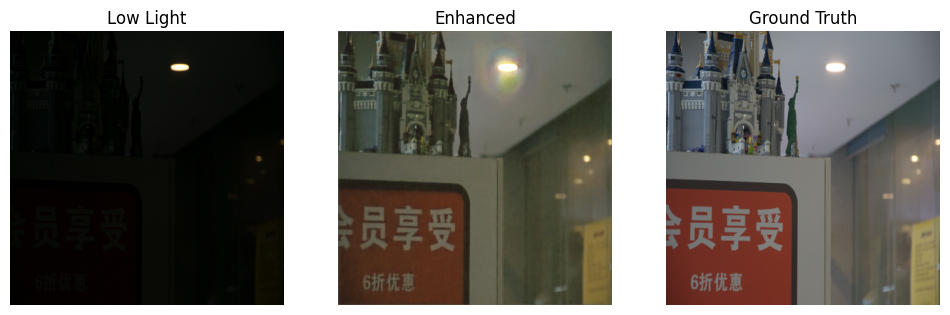

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


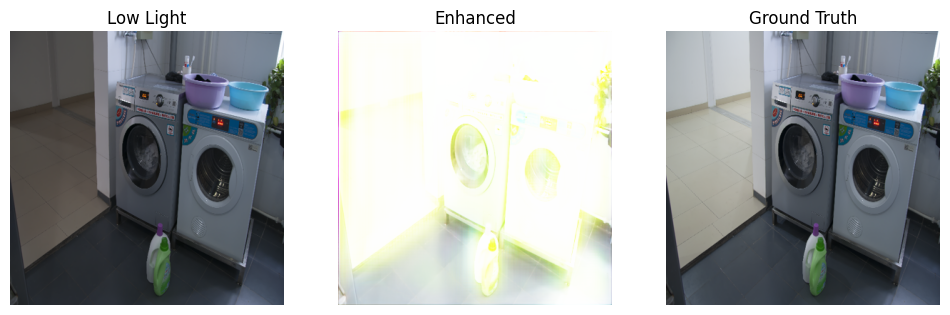

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


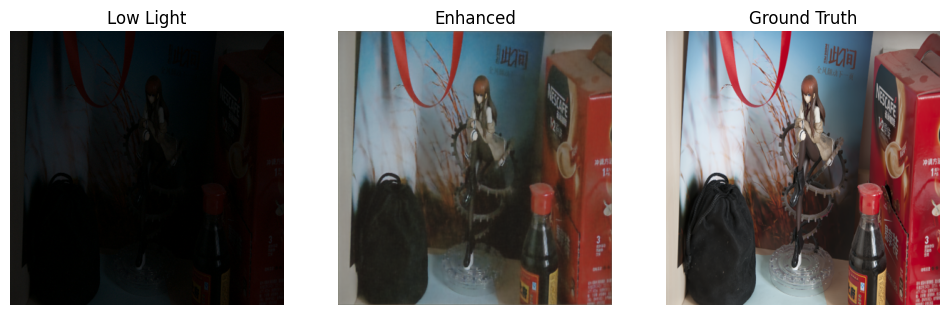

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


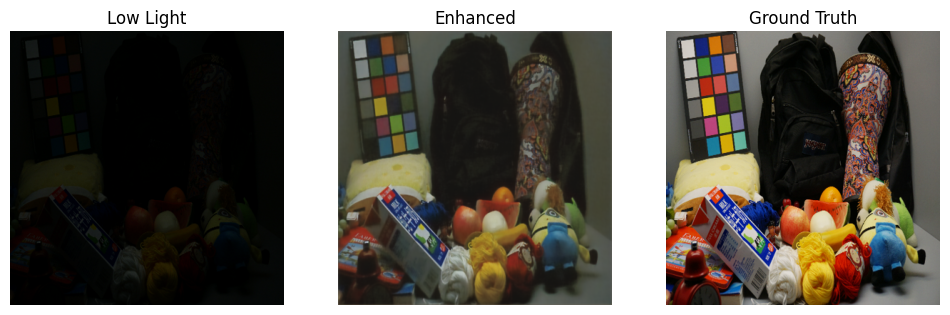

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


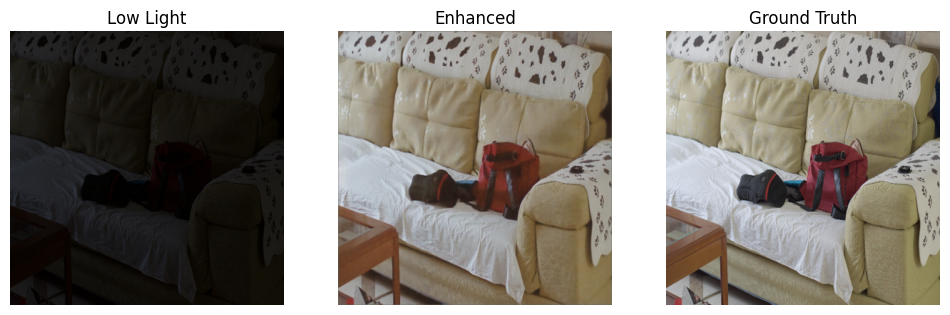

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


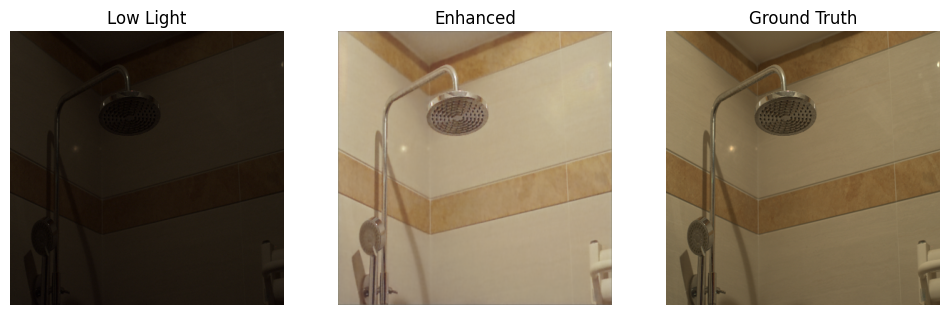

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


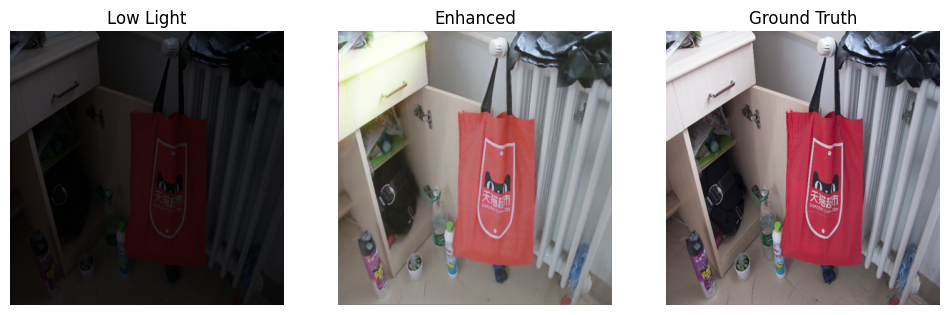

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


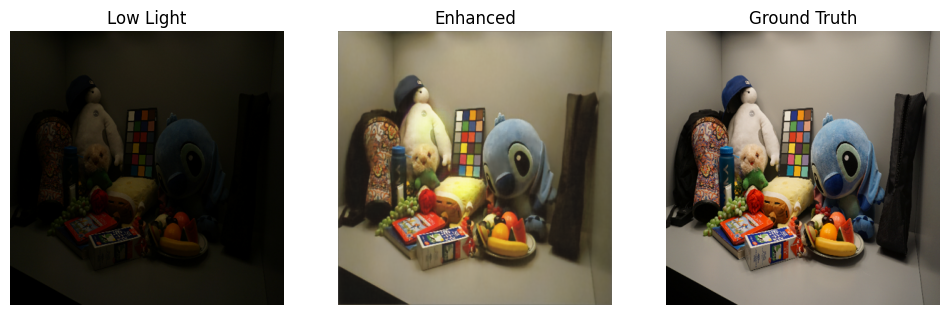

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


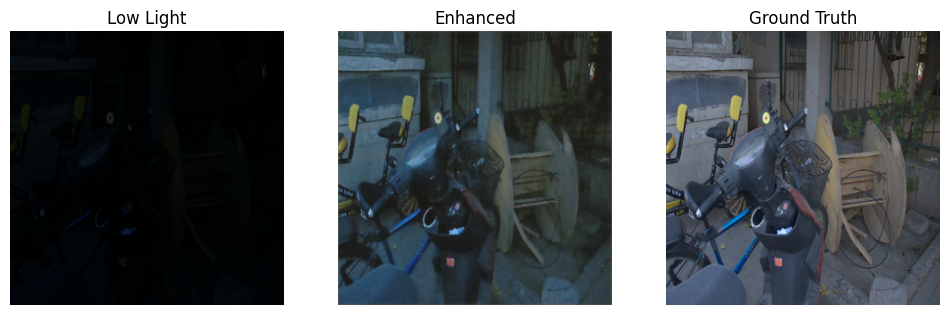

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


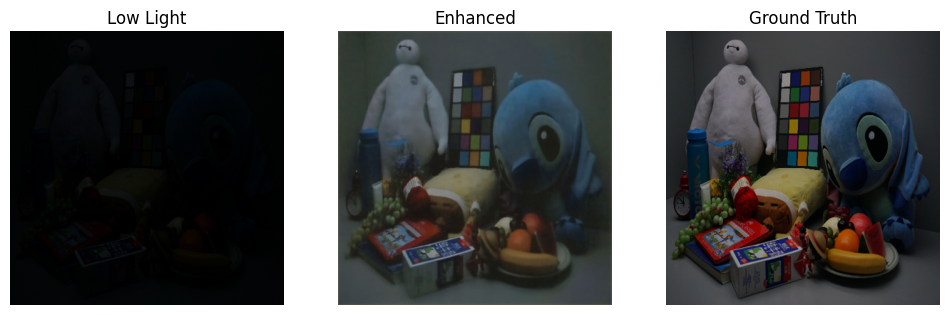

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


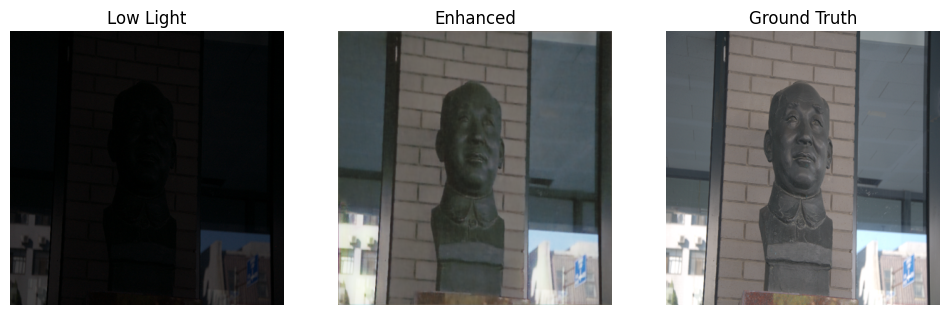

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


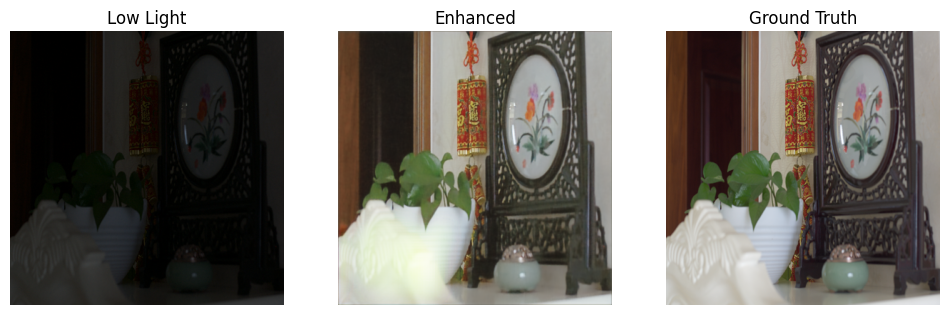

In [8]:
import cv2
sharpen_kernel = np.array([
    [0, -0.15, 0],
    [-0.15, 1.6, -0.15],
    [0, -0.15, 0]
])

# Example prediction
def show_prediction(idx):
    low_img = x_val[idx]
    output_img = model.predict(np.expand_dims(low_img, axis=0))[0]
    enhanced_img = cv2.filter2D(output_img, -1, sharpen_kernel)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title('Low Light')
    plt.imshow(low_img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Enhanced')
    plt.imshow(output_img)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Ground Truth')
    plt.imshow(y_val[idx])
    plt.axis('off')

    plt.show()

# Show example
for i in range(43,65,1):
    show_prediction(i)

In [24]:
from PIL import Image, ImageEnhance
import numpy as np

In [10]:
test_high_path='/kaggle/input/lol-dataset1/lol_dataset/eval15/high'
test_low_path='/kaggle/input/lol-dataset1/lol_dataset/eval15/low'

# Parameters
IMG_HEIGHT1 = 384
IMG_WIDTH1 = 384

# Helper function to load and preprocess images
def load_images1(low_dir, high_dir):
    low_paths = sorted(glob(os.path.join(low_dir, '*.png')))
    high_paths = sorted(glob(os.path.join(high_dir, '*.png')))

    low_images = []
    high_images = []

    for l_path, h_path in zip(low_paths, high_paths):
        low_img = Image.open(l_path).convert('RGB').resize((IMG_WIDTH1, IMG_HEIGHT1))
        high_img = Image.open(h_path).convert('RGB').resize((IMG_WIDTH1, IMG_HEIGHT1))

        low_img = np.array(low_img) / 255.0
        high_img = np.array(high_img) / 255.0

        low_images.append(low_img)
        high_images.append(high_img)

    return np.array(low_images), np.array(high_images)

print("Loading images...")
low_images1, high_images1 = load_images1(test_low_path, test_high_path)
print(f"Loaded {len(low_images1)} samples.")

Loading images...
Loaded 15 samples.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


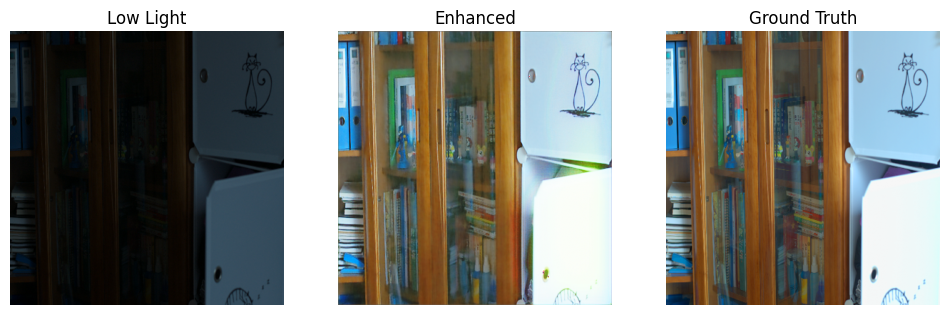

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


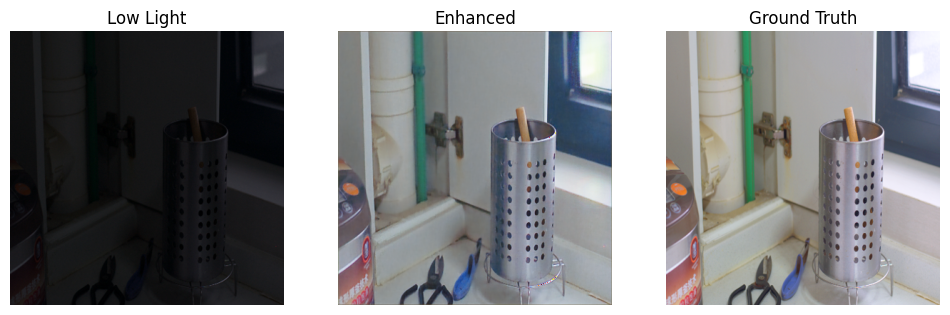

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


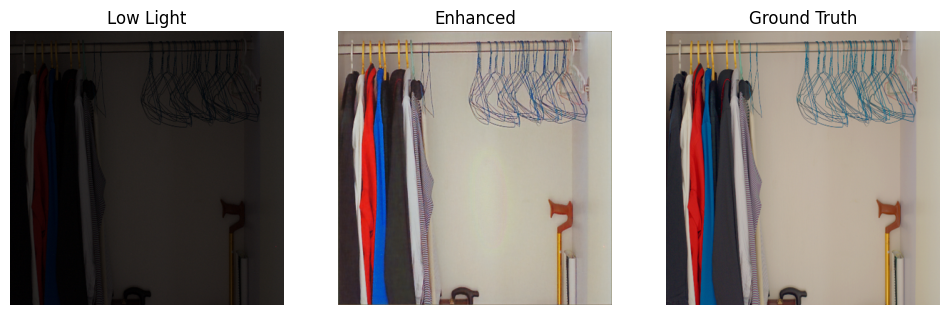

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


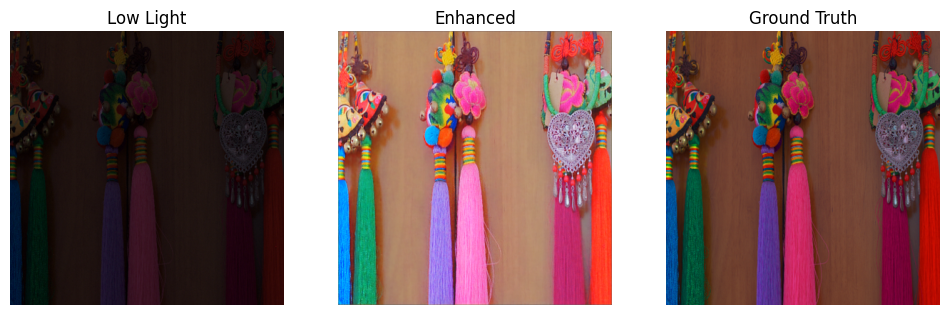

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


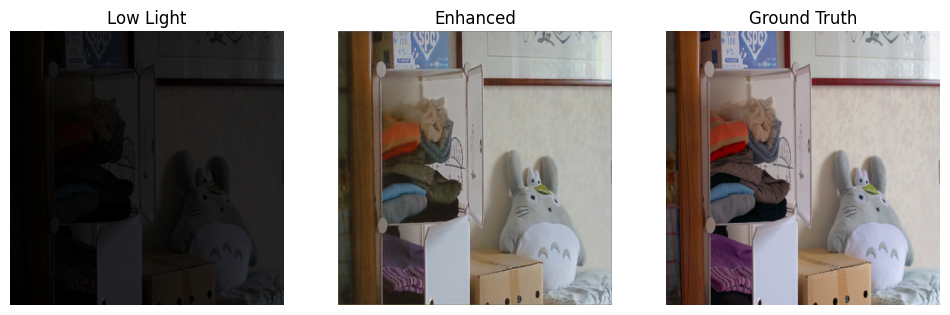

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


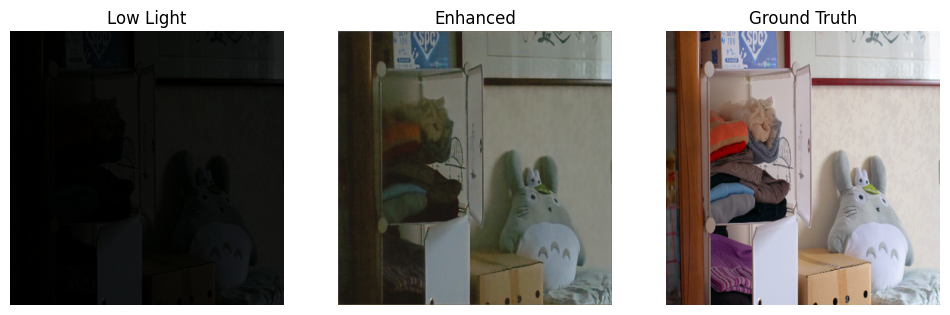

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


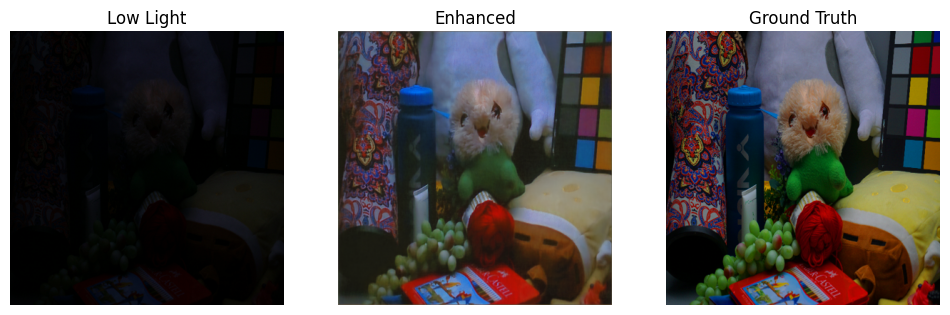

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


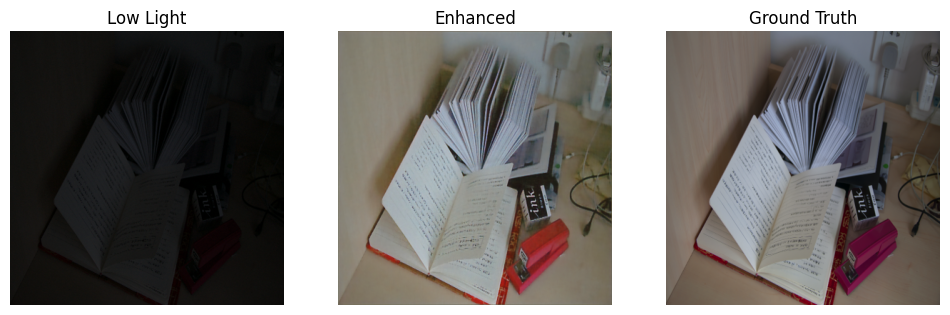

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


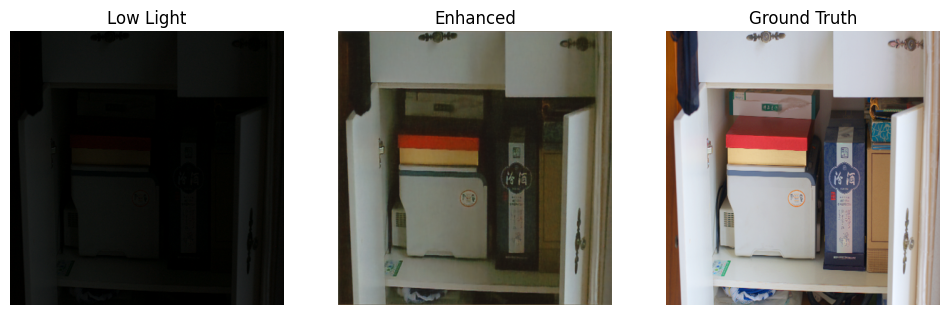

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


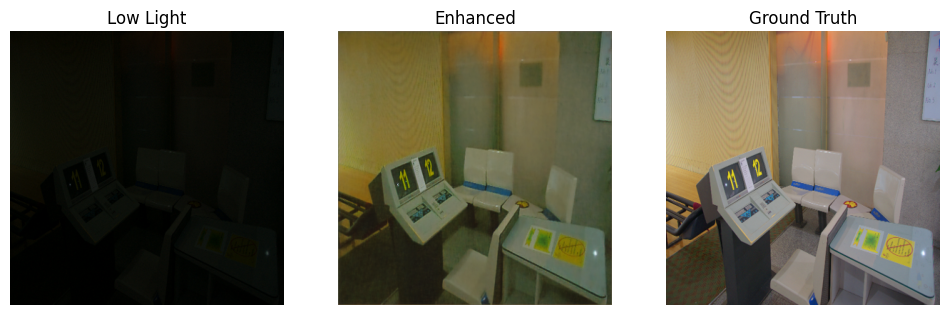

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


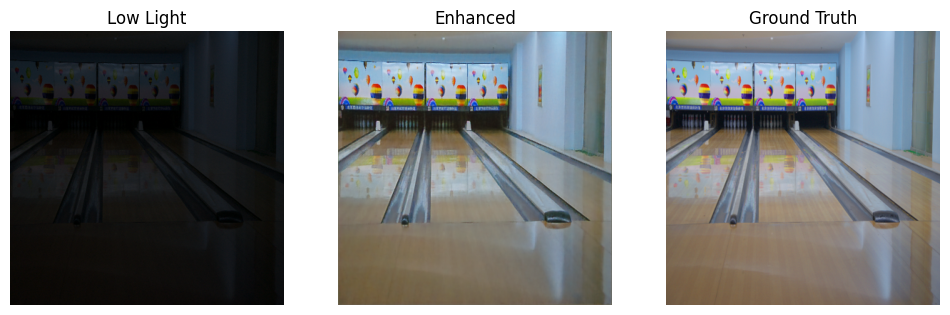

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


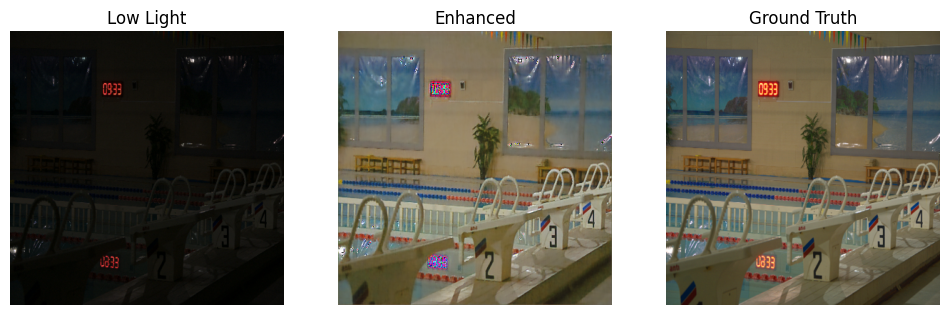

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


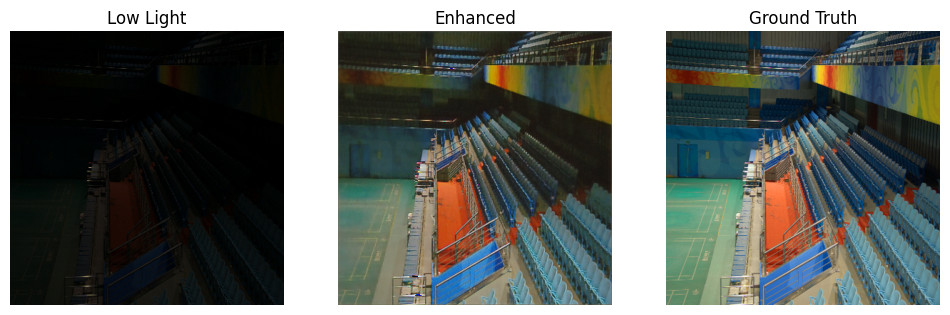

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


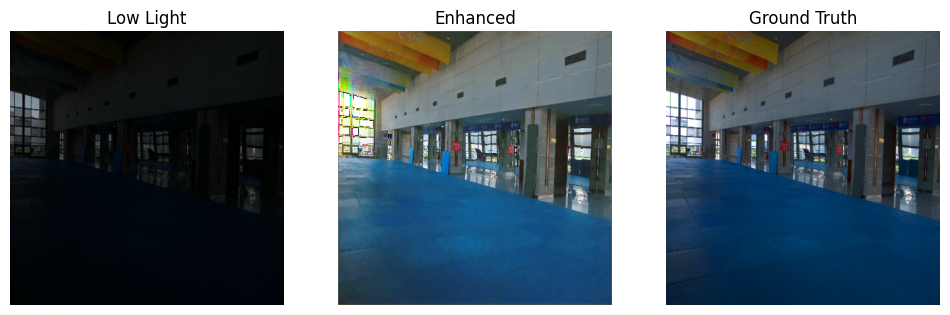

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


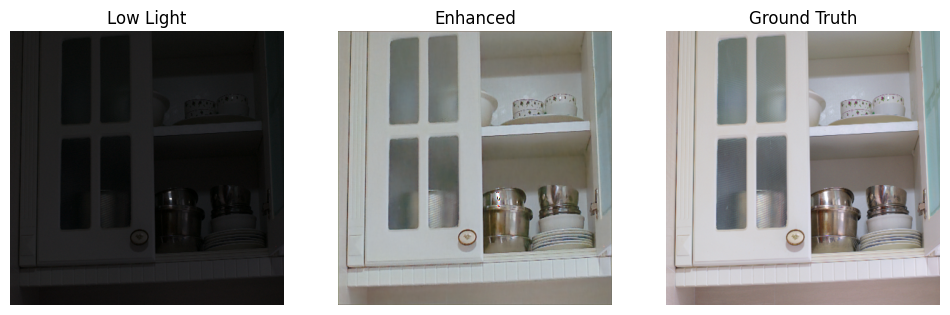

In [15]:
def apply_saturation(image_np, saturation_factor):
    # Convert NumPy array (0-1 float) to a PIL Image (0-255 uint8)
    image_np_uint8 = (image_np * 255).astype(np.uint8)
    pil_image = Image.fromarray(image_np_uint8)
    
    # Get the color enhancer
    enhancer = ImageEnhance.Color(pil_image)
    
    # Apply the enhancement
    enhanced_image = enhancer.enhance(saturation_factor)
    
    # Convert the enhanced PIL Image back to a NumPy array (0-1 float)
    saturated_image_np = np.array(enhanced_image) / 255.0
    
    return saturated_image_np

def show_prediction1(idx):
    low_img = low_images1[idx]
    output_img = model.predict(np.expand_dims(low_img, axis=0))[0]
    enhanced_img1 = cv2.filter2D(output_img, -1, sharpen_kernel)
    enhanced_img=apply_saturation(enhanced_img1,1.6)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title('Low Light')
    plt.imshow(low_img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Enhanced')
    plt.imshow(enhanced_img)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Ground Truth')
    plt.imshow(high_images1[idx])
    plt.axis('off')

    plt.show()

# Show example
for i in range(0,15,1):
    show_prediction1(i)